# Disclaimer
- [Tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html)
- [Cat Faces Dataset](https://www.kaggle.com/spandan2/cats-faces-64x64-for-generative-models)

In [1]:
from __future__ import print_function
import time
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
# Root directory for dataset
dataroot = "../Datasets/cats"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 512

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 200

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

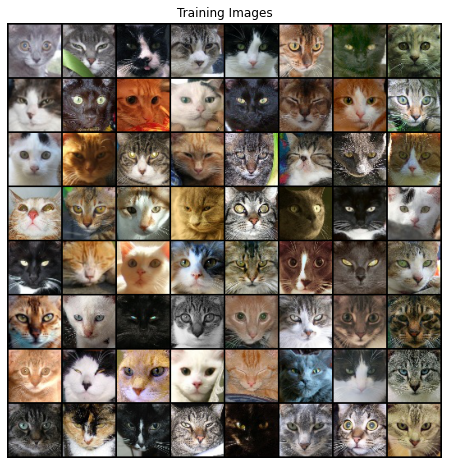

In [3]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [4]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
# Generator Code
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [6]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [7]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [9]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [10]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    start_time = time.time()
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
        
    print("="*89)
    print('Elapsed Time: ' + str(int(time.time()-start_time)) + 's')
    print("="*89)
    

Starting Training Loop...
[0/200][0/31]	Loss_D: 1.7709	Loss_G: 4.4893	D(x): 0.4472	D(G(z)): 0.5008 / 0.0192
Elapsed Time: 22s
[1/200][0/31]	Loss_D: 0.2604	Loss_G: 11.1904	D(x): 0.8554	D(G(z)): 0.0003 / 0.0000
Elapsed Time: 20s
[2/200][0/31]	Loss_D: 0.4313	Loss_G: 21.5943	D(x): 0.8010	D(G(z)): 0.0000 / 0.0000
Elapsed Time: 20s
[3/200][0/31]	Loss_D: 0.7028	Loss_G: 5.7115	D(x): 0.9242	D(G(z)): 0.4266 / 0.0058
Elapsed Time: 20s
[4/200][0/31]	Loss_D: 0.6679	Loss_G: 2.8382	D(x): 0.7588	D(G(z)): 0.2477 / 0.0724
Elapsed Time: 20s
[5/200][0/31]	Loss_D: 0.9535	Loss_G: 5.9619	D(x): 0.8746	D(G(z)): 0.5091 / 0.0047
Elapsed Time: 20s
[6/200][0/31]	Loss_D: 0.9377	Loss_G: 3.2087	D(x): 0.5247	D(G(z)): 0.0628 / 0.0570
Elapsed Time: 20s
[7/200][0/31]	Loss_D: 0.3103	Loss_G: 5.1940	D(x): 0.8282	D(G(z)): 0.0815 / 0.0070
Elapsed Time: 20s
[8/200][0/31]	Loss_D: 0.4828	Loss_G: 7.0643	D(x): 0.8993	D(G(z)): 0.2649 / 0.0017
Elapsed Time: 20s
[9/200][0/31]	Loss_D: 0.4672	Loss_G: 4.1886	D(x): 0.7535	D(G(z)): 0.0496

Elapsed Time: 20s
[30/200][0/31]	Loss_D: 0.7668	Loss_G: 5.8344	D(x): 0.8661	D(G(z)): 0.3798 / 0.0082
Elapsed Time: 20s
[31/200][0/31]	Loss_D: 0.5544	Loss_G: 4.2256	D(x): 0.7517	D(G(z)): 0.1688 / 0.0370
Elapsed Time: 20s
[32/200][0/31]	Loss_D: 0.7556	Loss_G: 5.1984	D(x): 0.8389	D(G(z)): 0.3598 / 0.0154
Elapsed Time: 20s
[33/200][0/31]	Loss_D: 1.5563	Loss_G: 1.7316	D(x): 0.3470	D(G(z)): 0.0107 / 0.3270
Elapsed Time: 20s
[34/200][0/31]	Loss_D: 0.5793	Loss_G: 4.2343	D(x): 0.7585	D(G(z)): 0.1797 / 0.0314
Elapsed Time: 20s
[35/200][0/31]	Loss_D: 0.6725	Loss_G: 3.7798	D(x): 0.6340	D(G(z)): 0.0730 / 0.0650
Elapsed Time: 20s
[36/200][0/31]	Loss_D: 0.9044	Loss_G: 4.0899	D(x): 0.6746	D(G(z)): 0.2855 / 0.0453
Elapsed Time: 20s
[37/200][0/31]	Loss_D: 0.8534	Loss_G: 5.8690	D(x): 0.8131	D(G(z)): 0.3894 / 0.0087
Elapsed Time: 20s
[38/200][0/31]	Loss_D: 0.8367	Loss_G: 5.2301	D(x): 0.8834	D(G(z)): 0.4188 / 0.0258
Elapsed Time: 20s
[39/200][0/31]	Loss_D: 0.5648	Loss_G: 3.3365	D(x): 0.7145	D(G(z)): 0.1255

[59/200][0/31]	Loss_D: 0.5542	Loss_G: 4.4853	D(x): 0.8363	D(G(z)): 0.2567 / 0.0253
Elapsed Time: 20s
[60/200][0/31]	Loss_D: 0.5681	Loss_G: 3.8532	D(x): 0.7803	D(G(z)): 0.2167 / 0.0446
Elapsed Time: 20s
[61/200][0/31]	Loss_D: 0.7402	Loss_G: 5.4518	D(x): 0.9121	D(G(z)): 0.4071 / 0.0185
Elapsed Time: 20s
[62/200][0/31]	Loss_D: 0.5078	Loss_G: 3.5815	D(x): 0.7948	D(G(z)): 0.1920 / 0.0512
Elapsed Time: 20s
[63/200][0/31]	Loss_D: 0.8953	Loss_G: 5.8491	D(x): 0.9152	D(G(z)): 0.4883 / 0.0075
Elapsed Time: 20s
[64/200][0/31]	Loss_D: 0.6687	Loss_G: 2.6418	D(x): 0.6580	D(G(z)): 0.1231 / 0.1347
Elapsed Time: 20s
[65/200][0/31]	Loss_D: 0.5669	Loss_G: 3.9037	D(x): 0.7901	D(G(z)): 0.2151 / 0.0444
Elapsed Time: 20s
[66/200][0/31]	Loss_D: 0.6646	Loss_G: 3.6743	D(x): 0.6127	D(G(z)): 0.0439 / 0.0615
Elapsed Time: 20s
[67/200][0/31]	Loss_D: 0.5326	Loss_G: 4.4631	D(x): 0.8713	D(G(z)): 0.2815 / 0.0232
Elapsed Time: 20s
[68/200][0/31]	Loss_D: 0.7645	Loss_G: 2.3235	D(x): 0.6031	D(G(z)): 0.0931 / 0.1430
Elapsed 

Elapsed Time: 20s
[89/200][0/31]	Loss_D: 0.5881	Loss_G: 2.8817	D(x): 0.8667	D(G(z)): 0.3133 / 0.0879
Elapsed Time: 20s
[90/200][0/31]	Loss_D: 0.6338	Loss_G: 3.7729	D(x): 0.8612	D(G(z)): 0.3413 / 0.0386
Elapsed Time: 20s
[91/200][0/31]	Loss_D: 0.5834	Loss_G: 2.4776	D(x): 0.6784	D(G(z)): 0.1099 / 0.1270
Elapsed Time: 20s
[92/200][0/31]	Loss_D: 0.5195	Loss_G: 2.6122	D(x): 0.7125	D(G(z)): 0.1180 / 0.1126
Elapsed Time: 20s
[93/200][0/31]	Loss_D: 0.6601	Loss_G: 2.3817	D(x): 0.6661	D(G(z)): 0.1624 / 0.1351
Elapsed Time: 20s
[94/200][0/31]	Loss_D: 0.9381	Loss_G: 1.8929	D(x): 0.4879	D(G(z)): 0.0606 / 0.2290
Elapsed Time: 20s
[95/200][0/31]	Loss_D: 0.6945	Loss_G: 1.9330	D(x): 0.6405	D(G(z)): 0.1433 / 0.1981
Elapsed Time: 20s
[96/200][0/31]	Loss_D: 0.7789	Loss_G: 4.7834	D(x): 0.9306	D(G(z)): 0.4530 / 0.0158
Elapsed Time: 20s
[97/200][0/31]	Loss_D: 0.6897	Loss_G: 2.1376	D(x): 0.6179	D(G(z)): 0.1126 / 0.1731
Elapsed Time: 20s
[98/200][0/31]	Loss_D: 0.6184	Loss_G: 4.1485	D(x): 0.9119	D(G(z)): 0.3638

[118/200][0/31]	Loss_D: 0.5367	Loss_G: 2.4303	D(x): 0.6662	D(G(z)): 0.0756 / 0.1248
Elapsed Time: 20s
[119/200][0/31]	Loss_D: 0.4645	Loss_G: 2.4159	D(x): 0.7732	D(G(z)): 0.1625 / 0.1198
Elapsed Time: 20s
[120/200][0/31]	Loss_D: 0.8700	Loss_G: 2.5656	D(x): 0.5866	D(G(z)): 0.1725 / 0.1268
Elapsed Time: 20s
[121/200][0/31]	Loss_D: 0.5650	Loss_G: 3.6480	D(x): 0.8389	D(G(z)): 0.2856 / 0.0401
Elapsed Time: 20s
[122/200][0/31]	Loss_D: 0.6980	Loss_G: 4.4994	D(x): 0.9181	D(G(z)): 0.4141 / 0.0195
Elapsed Time: 20s
[123/200][0/31]	Loss_D: 0.8908	Loss_G: 4.9865	D(x): 0.9159	D(G(z)): 0.4841 / 0.0189
Elapsed Time: 20s
[124/200][0/31]	Loss_D: 0.6386	Loss_G: 4.2779	D(x): 0.9032	D(G(z)): 0.3813 / 0.0229
Elapsed Time: 20s
[125/200][0/31]	Loss_D: 0.6341	Loss_G: 3.5040	D(x): 0.8615	D(G(z)): 0.3393 / 0.0534
Elapsed Time: 20s
[126/200][0/31]	Loss_D: 0.4122	Loss_G: 2.6486	D(x): 0.7903	D(G(z)): 0.1393 / 0.0992
Elapsed Time: 20s
[127/200][0/31]	Loss_D: 1.4815	Loss_G: 5.1221	D(x): 0.9293	D(G(z)): 0.6658 / 0.016

Elapsed Time: 21s
[148/200][0/31]	Loss_D: 0.3240	Loss_G: 2.6594	D(x): 0.8553	D(G(z)): 0.1378 / 0.0989
Elapsed Time: 21s
[149/200][0/31]	Loss_D: 1.3574	Loss_G: 6.0347	D(x): 0.9863	D(G(z)): 0.6740 / 0.0051
Elapsed Time: 21s
[150/200][0/31]	Loss_D: 0.4294	Loss_G: 3.5150	D(x): 0.8470	D(G(z)): 0.2061 / 0.0454
Elapsed Time: 21s
[151/200][0/31]	Loss_D: 0.4217	Loss_G: 4.3784	D(x): 0.9428	D(G(z)): 0.2820 / 0.0187
Elapsed Time: 21s
[152/200][0/31]	Loss_D: 1.0607	Loss_G: 3.6554	D(x): 0.8353	D(G(z)): 0.4729 / 0.0981
Elapsed Time: 21s
[153/200][0/31]	Loss_D: 0.4552	Loss_G: 4.1320	D(x): 0.8787	D(G(z)): 0.2519 / 0.0257
Elapsed Time: 21s
[154/200][0/31]	Loss_D: 0.5122	Loss_G: 2.2505	D(x): 0.7155	D(G(z)): 0.1173 / 0.1439
Elapsed Time: 21s
[155/200][0/31]	Loss_D: 0.4872	Loss_G: 4.5115	D(x): 0.9219	D(G(z)): 0.3095 / 0.0169
Elapsed Time: 21s
[156/200][0/31]	Loss_D: 0.4588	Loss_G: 4.5807	D(x): 0.9527	D(G(z)): 0.3104 / 0.0155
Elapsed Time: 21s
[157/200][0/31]	Loss_D: 1.0929	Loss_G: 6.6355	D(x): 0.9652	D(G(z

[177/200][0/31]	Loss_D: 0.2393	Loss_G: 3.6845	D(x): 0.9202	D(G(z)): 0.1372 / 0.0358
Elapsed Time: 21s
[178/200][0/31]	Loss_D: 1.9156	Loss_G: 1.3111	D(x): 0.1948	D(G(z)): 0.0038 / 0.3464
Elapsed Time: 21s
[179/200][0/31]	Loss_D: 0.3958	Loss_G: 2.8630	D(x): 0.8159	D(G(z)): 0.1488 / 0.0846
Elapsed Time: 21s
[180/200][0/31]	Loss_D: 2.2274	Loss_G: 5.0692	D(x): 0.9829	D(G(z)): 0.8249 / 0.0210
Elapsed Time: 21s
[181/200][0/31]	Loss_D: 0.3453	Loss_G: 3.1155	D(x): 0.7660	D(G(z)): 0.0535 / 0.0716
Elapsed Time: 21s
[182/200][0/31]	Loss_D: 0.6317	Loss_G: 2.4897	D(x): 0.6090	D(G(z)): 0.0531 / 0.1199
Elapsed Time: 21s
[183/200][0/31]	Loss_D: 0.3939	Loss_G: 2.3088	D(x): 0.7829	D(G(z)): 0.1195 / 0.1375
Elapsed Time: 21s
[184/200][0/31]	Loss_D: 0.7408	Loss_G: 6.3669	D(x): 0.9702	D(G(z)): 0.4570 / 0.0033
Elapsed Time: 21s
[185/200][0/31]	Loss_D: 0.2811	Loss_G: 3.5443	D(x): 0.9052	D(G(z)): 0.1524 / 0.0412
Elapsed Time: 21s
[186/200][0/31]	Loss_D: 0.2055	Loss_G: 3.2786	D(x): 0.9051	D(G(z)): 0.0950 / 0.053

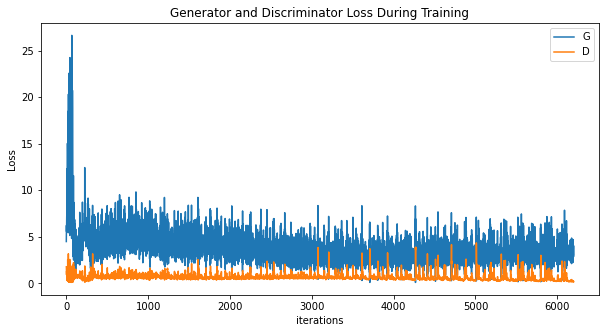

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

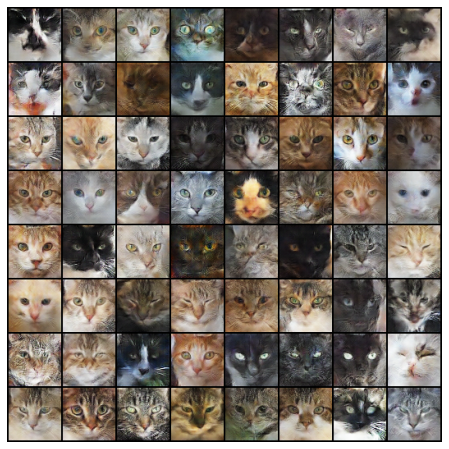

In [12]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())